# Data-Oriented Programming Paradigms 2023W: Exercise 2

Group **30**: Ahmed Sabanovic, Ivan Babiy, Vladimir Panin, Yat Hin Chan

Initially having selected **Question 12**, our primary inquiry revolves around determining the conditions associated with the immigration of skilled individuals in the EU. Therefore, our question can be defined as:

*   **What conditions are associated with immigration of skilled people?**

***

**Instructions to run this notebook:**

*   Create a conda environment with the submitted `environment.yml` with this command:  
  `conda env create -f environment.yml`
*   This notebook does not depend on external data files




## 1. Motivation/Questions

Migration is the defining issue of our generation and has polarized politics around the world. However, even those who oppose unskilled migration and asylum seekers are usually in favor of skilled migrants.

In this exercise, we are going to investigate the percentage of foreign born population that has a tertiary education, meaning a university degree or some form of technical training. In our project only the EU countries will be looked at. The goal is to find explanatory variables to explain where well educated people are migration to and what possible explications there are. Furthermore, it will be investigated if we can identify groups of countries and what factors contribute to possible clusters. On that basis advice for policy makers is going to be given out to shape a political agend by which skilled migration is encourage to compensate for demographic problems.



In [113]:
#All the EU countries
EU_COUNTRIES = ['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia',
       'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece',
       'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg',
       'Malta', 'Netherlands', 'Poland', 'Portugal', 'Romania',
       'Slovakia', 'Slovenia', 'Spain', 'Sweden']

***
## 2. Data gathering and pre-processing

In this part the necessary data is gathered, processed, merged and finally described. A sizeable amount of time was spent to find the right dataset and pick the correct dependent variable. For example a big question for the group work to decide whether stock or flow variables should be looked at. Finally, it was decided to look at stock variables as flow can be skewed by geopolitical events. A stock is a more robust predictor as it also takes into account larger periods of time. Additionally, for the flow variables no data on educational background was provided and therefore could not be used to answer our initial question.



### 2.0. Set up

In this section all the necessary libraries are imported, some Pandas options are specified and and BASE is defined to retrieve data from Eurostat.

In [114]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import io
import requests
import json
from pyjstat import pyjstat
import seaborn as sns
import seaborn.objects as so
from bs4 import BeautifulSoup as BS
import geopandas as gpd
import pycountry
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, LeaveOneOut
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.neighbors import KNeighborsRegressor
from pandas.plotting import parallel_coordinates
from scipy.stats import ttest_ind

In [115]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
BASE = 'https://ec.europa.eu/eurostat/api/dissemination/statistics/1.0/data'

After importing all the necessary libraries, comes the data retrieval part. In our project a mixture of economic variables and soft factors like for example corruption, freedom and english proficiency were used.

The underlying though consisted in the idea, that skilled migrants prefer more advanced economies and therefore prefer to migrate there more elaborately. However, for people those skilled migrants also the adoption and the integration to the country's culture and language might be a substantial hurdle. Therefore, skilled migrants might also consider besides the economic circumstances different social factors.

### 2.1. Eurostat - Population by country

https://ec.europa.eu/eurostat/databrowser/view/demo_pjan/default/table?lang=en

**Motivation**: Population by country is crucial for understanding immigration patterns among skilled and young people because it provides a baseline demographic context.

Our response variable should be in proportion to the population of the respective country. This dataset will thus be used as the normalising factor

**Processing**:The data was imported from eurostat. No missing values, outliers, or inconsistencies were found in the data.

In [116]:
#Download the dataset from Eurostat
j = pyjstat.Dataset.read(f'{BASE}/demo_pjan')
pop = j.write('dataframe')

In [117]:
#Filter it on the year 2021, all ages, total sex and rename value to population.
pop_p = (
    pop[
        (pop['Time'] == '2021') &
        (pop['Geopolitical entity (reporting)'].str.len() < 20) &
        (pop['Age class'] == 'Total') &
        (pop['Sex'] == 'Total')
    ]
    .rename({'value': 'Population'}, axis=1)
)

### 2.2. Eurostat - Foreign-born population by sex, age, main reason for migrating, country of birth and educational attainment level

https://ec.europa.eu/eurostat/databrowser/product/view/lfsa_pfgacedm?lang=en

The proportion of foreign-born population with tertiary education is the dependent variable that we aim to explain. We derive this from the titled dataset from Eurostat. It's important to note that the dataset is limited to 2021, because that's the only available data for the Foreign-born population.

The data unfortunately doesn't reveal the country of origin of those skilled migrants. Also it doesn't indicate if those people with tertiary education were able to fill a position in a tertiary education sector. The successful integration into a job is not taken into account in this task. Another simplification made is that it is not considered whether the skilled migrants got their education in their country of origin, in the country they are living in or a different country. Based on this data, it can be observed which countries attract migrants or migrants that are able to attain a Tertiar education. Finally, other types of migration are not going to be looked at.

In [118]:
j = pyjstat.Dataset.read(f'{BASE}/lfsa_pfgacedm')
fpop = j.write('dataframe')

In [119]:
fpop_ed = (
    fpop[
        (fpop['Sex'] == 'Total') &
        (fpop['Age class'] == 'From 15 to 74 years') &
        (fpop['Reason'] == 'Total') &
        (fpop['International Standard Classification of Education (ISCED 2011)'] == 'Tertiary education (levels 5-8)') &
        (fpop['Geopolitical entity (reporting)'].isin(EU_COUNTRIES))
    ]
    .groupby(
        ['Geopolitical entity (reporting)', 'Time', 'International Standard Classification of Education (ISCED 2011)']
    ).sum('value')
    .reset_index()
    .pivot(
        index=['Geopolitical entity (reporting)', 'Time'],
        columns=['International Standard Classification of Education (ISCED 2011)'],
        values = 'value'
    )
    .rename_axis(columns=None)
)

In [120]:
#Dataframe for reason of going to a country
fpop_reason = (
    fpop[
        (fpop['Sex'] == 'Total') &
        (fpop['Age class'] == 'From 15 to 74 years') &
        (fpop['International Standard Classification of Education (ISCED 2011)'] == 'All ISCED 2011 levels') &
        (fpop['Geopolitical entity (reporting)'].isin(EU_COUNTRIES))
    ]
    .groupby(
        ['Geopolitical entity (reporting)', 'Time', 'Reason']
    ).sum('value')
    .reset_index()
    .pivot(
        index=['Geopolitical entity (reporting)', 'Time'],
        columns=['Reason'],
        values = 'value'
    )
    .rename_axis(columns=None)
)

In [121]:
#Merge the education and reason dataset
fpop_agg = pd.merge(fpop_ed, fpop_reason, left_index=True, right_index=True).reset_index()

In [122]:
#Merge it with Population
fpop_agg_pop=fpop_agg.merge(pop_p[['Geopolitical entity (reporting)', 'Population']], on='Geopolitical entity (reporting)', how='left')

In [123]:
#Create the response variable "Foreign-born population with tertiary education per 1000"
fpop_agg_pop["Foreign-born population with tertiary education per 1000"]=1000*1000*fpop_agg_pop["Tertiary education (levels 5-8)"]/fpop_agg_pop["Population"]
fpop_agg_pop["Foreign born asylum seekers per 1000 perpopulation"]=1000*1000*fpop_agg_pop["International protection or asylum"]/fpop_agg_pop["Population"]
fpop_agg_pop = fpop_agg_pop[["Geopolitical entity (reporting)", "Foreign-born population with tertiary education per 1000", "Foreign born asylum seekers per 1000 perpopulation"]]

In [124]:
fpop_agg_pop.head()

,Geopolitical entity (reporting),Foreign-born population with tertiary education per 1000,Foreign born asylum seekers per 1000 perpopulation
0,Austria,104.940699,45.495946
1,Austria,124.442160,61.314295
2,Belgium,100.131833,26.352760
3,Belgium,105.289877,34.626401
4,Bulgaria,1.056319,0.000000


### 2.3. Total housing costs in Purchasing Power Standard (pps) for tenants

Housing costs are an important factor for whether migration makes economic sense. On one hand, high housing costs might discourage immigration. On the other, it might mean that only highly educated people can take advantage of the premium from moving into expensive countries, while since the wage premium for low-skilled workers is lower when moving into expensive areas, they are deterred from doing so [1].

To see what role housing costs play, we retrieved the Total housing costs in Purchasing Power Standard from Eurostat. It includes all costs born by the tenant including rent, utilities, insurances, etc. With the assumption that high-skilled workers rent a place when they move, we consider only the costs for tenants within the dataset.

We noticed that for the year 2021, the figure for France is missing. We handled it by interpolating its value using 2020 and 2022 figures.

Source: https://ec.europa.eu/eurostat/databrowser/view/ilc_mded03/default/table?lang=en

In [125]:
#Download the data
j = pyjstat.Dataset.read(f'{BASE}/ilc_mded03')
house = j.write('dataframe')

In [126]:
#Filter the data on the "Total evaluation"
house_p = (
    house[
        # (ex['Time'] == '2021') &
        (house['Geopolitical entity (reporting)'].str.len() < 20) &
        (house['Type of household'] == 'Total') &
        (house['Tenure status'] == 'Tenant') &
        (house['Income situation in relation to the risk of poverty threshold'] == 'Total')
    ]
    [['Time', 'Geopolitical entity (reporting)', 'value']]
)

In [127]:
# Interpolate the value for France
house_p.loc[
    (house["Geopolitical entity (reporting)"] == "France"), "value"
] = house_p.loc[
    (house["Geopolitical entity (reporting)"] == "France"), "value"
].interpolate()
# Rename the column
house_p = (
    house_p[house["Time"] == "2021"]
    .rename({"value": "Total housing costs in pps"}, axis="columns")
    .drop("Time", axis=1)
)

# Notice the the Nan values only apply to Non-EU values
house_p.head()

C:\Users\leo\AppData\Local\Temp\ipykernel_5296\3708268330.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  house_p[house["Time"] == "2021"]


,Geopolitical entity (reporting),Total housing costs in pps
103154,Belgium,727.4
103176,Bulgaria,400.1
103198,Czechia,542.3
103220,Denmark,801.4
103242,Germany,696.8


### 2.4. Eurostat - Total unemployment rate
*https://ec.europa.eu/eurostat/databrowser/view/tps00203/default/table?lang=en*

**Description**: "Unemployment rates show the percentage of jobless individuals in the workforce (15 to 74 years old) who are actively seeking employment or have found a job to start within three months."

**Motivation**: Having total unemployment rate data is important because it provides a key indicator of the overall health of the economy. A low unemployment rate generally indicates a strong economy, creating more job opportunities and attracting skilled individuals

**Processing**:The data was imported from eurostat. No missing values, outliers, or inconsistencies were found in the data.


In [128]:
lj = pyjstat.Dataset.read(f'{BASE}/tps00203')
unemployment = lj.write('dataframe')

In [129]:
# Filter dataset
unemp_agg = (
    unemployment[
        (unemployment["Time"] == "2021")
        & (unemployment["Unit of measure"]== "Percentage of population in the labour force")
    ]
    .rename(columns={"value": "Unemployment Rate"})
    .loc[:, ["Geopolitical entity (reporting)", "Unemployment Rate"]]
    .iloc[3:]
    .reset_index(drop=True)
)

# Only NonEU Values are NaNs
unemp_agg.head()

,Geopolitical entity (reporting),Unemployment Rate
0,Belgium,6.3
1,Bulgaria,5.2
2,Czechia,2.8
3,Denmark,5.1
4,Germany,3.7


### 2.5. Eurostat - Average salary
*https://ec.europa.eu/eurostat/databrowser/view/nama_10_fte/default/table?lang=en*

**Description**: "The 'average full-time adjusted salaries' is a Eurostat indicator set by the Blue Card Directive to determine the salary threshold for granting working permits to high-skilled workers, ensuring a decent living in a Member State."

**Motivation**: Having average salary data is important as it helps identify economic opportunities and attractiveness of a region which often attracts skilled workers and younger demographics who wish to have a better quality of life. Strong correlation with GDP per capita is expected.

**Processing**:The data was imported from eurostat. There were missing values for Netherlands and Norway. They were imputed manually using official government sources from these countries as a source. There were no outliers, or other inconsistencies in the data.


In [130]:
nj = pyjstat.Dataset.read(f'{BASE}/nama_10_fte')
salary = nj.write('dataframe')

In [131]:
sal_agg = (salary[salary["Time"] == "2021"]
           .rename(columns={"value": "Average Salary"})
           .loc[:, ["Geopolitical entity (reporting)", "Average Salary"]]
           .drop_duplicates(subset=["Geopolitical entity (reporting)"])
           .iloc[2:]
           .reset_index(drop=True))

# Filling the missing value using data from this website: https://longreads.cbs.nl/the-netherlands-in-numbers-2023/what-is-working-peoples-income/#:~:text=The%20income%20of%20people%20in,20%20and%2050%20thousand%20euros.
netherlands_row = pd.DataFrame({"Geopolitical entity (reporting)": ["Netherlands"], "Average Salary": [46900.0]})
sal_agg= pd.concat([sal_agg, netherlands_row], ignore_index=True)

# Filling the missing value using data from this website: https://www.ssb.no/en/arbeid-og-lonn/lonn-og-arbeidskraftkostnader/statistikk/lonn
norway_row = pd.DataFrame({"Geopolitical entity (reporting)": ["Norway"], "Average Salary": [50790.0]})
sal_agg = pd.concat([sal_agg, norway_row], ignore_index=True)

sal_agg.head()

,Geopolitical entity (reporting),Average Salary
0,Belgium,49696.0
1,Bulgaria,10345.0
2,Czechia,18875.0
3,Denmark,63003.0
4,Germany,45727.0


### 2.6. Corruption index


*https://www.transparency.org/en/cpi/2022*

**Description**: "The CPI ranks 180 countries and territories around the world by their perceived levels of public sector corruption, scoring on a scale of 0 (highly corrupt) to 100 (very clean)."

**Motivation**: Corruption might be a driving factor for leaving a country as strong corruption is not beneficial to economic growth and diminishes trust in government

**Processing**:The data was manually entered due to lack of machine-friendly retrieval options. No missing values, outliers, or inconsistencies were found in the data.


In [132]:
eu_countries_cpi = {
    "Austria": 71,
    "Belgium": 73,
    "Bulgaria": 43,
    "Croatia": 50,
    "Cyprus": 52,
    "Czechia": 56,
    "Denmark": 90,
    "Estonia": 74,
    "Finland": 87,
    "France": 72,
    "Germany": 79,
    "Greece": 52,
    "Hungary": 42,
    "Ireland": 77,
    "Italy": 56,
    "Latvia": 59,
    "Lithuania": 62,
    "Luxembourg": 77,
    "Malta": 51,
    "Netherlands": 80,
    "Norway": 84,
    "Poland": 55,
    "Portugal": 62,
    "Romania": 46,
    "Slovakia": 53,
    "Slovenia": 56,
    "Spain": 60,
    "Sweden": 83
}

In [133]:
# Convert the dictionary to a DataFrame
cpi_df = pd.DataFrame(list(eu_countries_cpi.items()), columns=["Geopolitical entity (reporting)", "Corruption Index"])

# Display the result DataFrame
cpi_df

,Geopolitical entity (reporting),Corruption Index
0,Austria,71
1,Belgium,73
2,Bulgaria,43
3,Croatia,50
4,Cyprus,52
5,Czechia,56
6,Denmark,90
7,Estonia,74
8,Finland,87
9,France,72


### 2.7. Migrant Integration Policy Index (MIPEX)

*https://www.mipex.eu/play/*

**Description**: "The Migrant Integration Policy Index (MIPEX) is a unique tool which measures policies to integrate migrants in 56 countries, including all EU Member States. The index is a useful tool to evaluate and compare what governments are doing to promote the integration of migrants in all the countries analyzed. The Joint Research Center of the European Commission compared MIPEX to other indexes and concluded that “no other index currently offers the same coverage. In addition, the index is one of the few ‘alive’ sources for migration policies, and moreover allow comparison between countries and within countries (over time)”"_

**Motivation**: High-skilled individuals may want to migrate to countries that are attractive for them, therefore the MIPEX measure might be a reasonable indicator. This measure is a possibility to account for the soft or social factors limiting or promoting tertiary education migrants.

**Processing**:The MIPEX data was manually entered due to lack of machine-friendly retrieval options. No missing values, outliers, or inconsistencies were found in the data.


In [134]:
# Manually enter the MIPEX data
eu_countries_mipex = {
    "Austria": 46,
    "Belgium": 69,
    "Bulgaria": 40,
    "Croatia": 39,
    "Cyprus": 41,
    "Czechia": 50,
    "Denmark": 49,
    "Estonia": 50,
    "Finland": 85,
    "France": 56,
    "Germany": 58,
    "Greece": 46,
    "Hungary": 43,
    "Ireland": 64,
    "Italy": 58,
    "Latvia": 37,
    "Lithuania": 37,
    "Luxembourg": 64,
    "Malta": 48,
    "Netherlands": 57,
    "Norway": 69,
    "Poland": 40,
    "Portugal": 81,
    "Romania": 49,
    "Slovakia": 39,
    "Slovenia": 48,
    "Spain": 60,
    "Sweden": 86,
}

In [135]:
# Convert the dictionary to a DataFrame
mipex_df = pd.DataFrame(list(eu_countries_mipex.items()), columns=["Geopolitical entity (reporting)", "MIPEX score"])

# Display the result DataFrame
mipex_df

,Geopolitical entity (reporting),MIPEX score
0,Austria,46
1,Belgium,69
2,Bulgaria,40
3,Croatia,39
4,Cyprus,41
5,Czechia,50
6,Denmark,49
7,Estonia,50
8,Finland,85
9,France,56


### 2.8 GDP per capita

GDP per capita is an important economic measure often used to measure relative wealth of a country, and is usually correlated with broader aspects of a country such as economic opportunities, quality of life, job market, education, infrastructure, security, etc.

“The indicator is a measure of economic activity and is commonly used as a proxy for the development in a country’s material living standards. It is calculated as the ratio of real GDP to the average population of a specific year. GDP measures the value of total final output of goods and services produced by an economy within a certain period of time.”


https://ec.europa.eu/eurostat/databrowser/view/sdg_08_10/default/table?lang=en

...

In [136]:
# Read data from EUROSTAT
j = pyjstat.Dataset.read(f'{BASE}/sdg_08_10')
economic = j.write('dataframe')

In [137]:
econ_agg = (economic.assign(value=pd.to_numeric(economic["value"]))
            .loc[(economic["Time"] == "2021") &
                 (economic["Unit of measure"].str.startswith("Chain linked volumes (2010)")) &
                 ~(economic["Geopolitical entity (reporting)"].str.contains("20")), :]
            .rename(columns={"value": "GDP pc"})
            .loc[:, ["Geopolitical entity (reporting)", "GDP pc"]])
econ_agg

,Geopolitical entity (reporting),GDP pc
121,Belgium,35950.0
146,Bulgaria,7380.0
171,Czechia,18620.0
196,Denmark,51260.0
221,Germany,36460.0
246,Estonia,16140.0
271,Ireland,72670.0
296,Greece,17820.0
321,Spain,24020.0
346,France,32800.0


### 2.9 European Coffee Trip

https://europeancoffeetrip.com/city-guides/

Apart from a higher pay, other factors that draw educated workers to a place include being more likely to find friends and the amenities that they like [1]. One of these amenities is trendy cafes. We therefore like to explore whether the existence of this type of cafes really attracts educated migration.

In Europe, European Coffee Trip is a review site for trendy specialty coffee shop. From it's city guide, we scrape the number of specialty coffee shops that each country has. We then normalize the number by the countries' population to obtain a Specialty cafes per million metric.

In [138]:
soup = BS(requests.get('https://europeancoffeetrip.com/city-guides/').content, 'lxml')
cafes = {}
for c in soup.find_all('h3')[1:-6]:
    country = c.string
    if c.string == 'Czech Republic':
        country = 'Czechia'
    if c.parent.get('href') is None:
        continue
    cp = BS(requests.get(c.parent.get('href')).content, 'lxml')
    if len(cp.find_all(class_='cg-title-style', limit=2)) > 0: 
        cafes[country] = int(cp.find_all(class_='cg-title-style', limit=2)[1].string.split(' ')[0])
    else:
        cafes[country] = 0

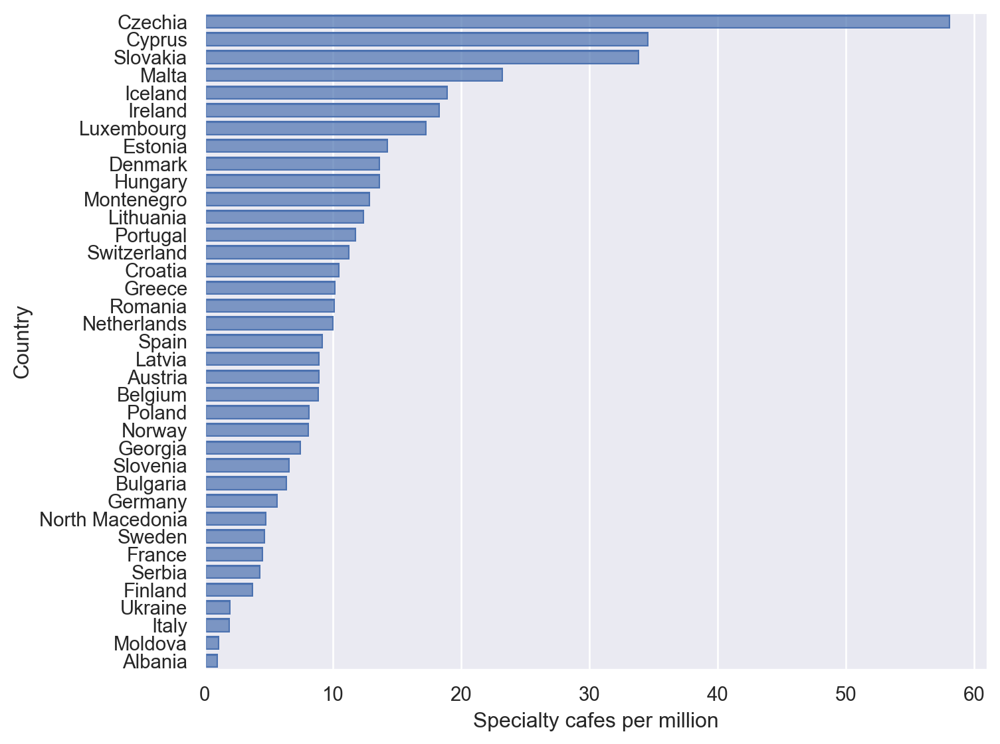

In [139]:
cafe_p = pd.DataFrame.from_dict(cafes, orient='index', columns=['Number of specialty cafes'])
cafe_p = (
    cafe_p
        .reset_index().rename({'index': 'Geopolitical entity (reporting)'}, axis='columns')
        .merge(pop_p, on="Geopolitical entity (reporting)", how='inner')
)
cafe_p['Specialty cafes per million'] = cafe_p['Number of specialty cafes'] / cafe_p['Population'] * 1e6
(
    so.Plot(
        cafe_p.dropna().sort_values('Specialty cafes per million', ascending=False),
        y='Geopolitical entity (reporting)',
        x='Specialty cafes per million'
    )
    .add(so.Bar())
    .layout(size=(8,6))
    .label(y='Country')
)

European Coffee Trip is based on Czech. That should be why Czech (and neighbouring Slovakia) have disproportionately many reviewed specialty coffee shops. We handle them by replace their values with the 3rd highest value.

In [140]:
cafe_p.loc[(cafe_p['Geopolitical entity (reporting)'] == 'Czechia'), 'Specialty cafes per million'] = cafe_p['Specialty cafes per million'].nlargest(2).iloc[1]
cafe_p = cafe_p.loc[cafe_p['Geopolitical entity (reporting)'].isin(EU_COUNTRIES), ['Geopolitical entity (reporting)', 'Specialty cafes per million']]
cafe_p.head()

,Geopolitical entity (reporting),Specialty cafes per million
0,Czechia,34.597944
2,Germany,5.736273
3,Spain,9.219254
4,France,4.591858
5,Poland,8.172985


### 2.10 Employment in Foreign Controlled Enterprises

https://ec.europa.eu/eurostat/databrowser/view/egi_em1/default/table?lang=en

**Description**: This Eurostat dataset presents employment statistics focusing on enterprises under foreign control.

**Motivation**: This indicator could help assess the international job market, economic stability, industry diversity, and opportunities for skill utilization. It could reflect aspects such as international job market, innovation, etc. It could provide valuable information for educated migrants.

**Processing**: The dataset was preprocessed by filtering out irrelevant rows, deleting data for Bosnia and Herzegovina and the United Kingdom, and manually inputting values for France and Norway in 2019. No other missing values, outliers, or inconsistencies were found in the data

In [141]:
#Download the data
j = pyjstat.Dataset.read(f'{BASE}/egi_em1')
femp = j.write('dataframe')

In [142]:
#Filter data and delete unnecessary rows
femp_p = (
    femp[
        (femp['Time'] >= '2020') &
        (femp['Unit of measure'] == 'Percentage of total') &
        (~femp['Geopolitical entity (reporting)'].isin(['European Union - 27 countries (from 2020)', 'Euro area – 20 countries (from 2023)', 'European Union - 28 countries (2013-2020)', 'European Union - 27 countries (2007-2013)']))
    ]
    [['Geopolitical entity (reporting)', 'value']]
    .rename({'value': 'Employment in Foreign Controlled Enterprises (%)'}, axis = 'columns')
)

#Deleting unnecessary values
femp_p = femp_p[femp_p['Geopolitical entity (reporting)'] != 'Bosnia and Herzegovina']
femp_p = femp_p[femp_p['Geopolitical entity (reporting)'] != 'United Kingdom']

In [143]:
#Manually imputing values for France and Norway

#France
france_value=femp[(femp["Geopolitical entity (reporting)"]=="France")  & (femp["Time"]=="2019") & (femp["value"]>=0)]["value"].iloc[0,]
femp_p.loc[femp_p["Geopolitical entity (reporting)"]=="France", "Employment in Foreign Controlled Enterprises (%)"]=france_value

#Norway
norway_value=femp[(femp["Geopolitical entity (reporting)"]=="Norway")  & (femp["Time"]=="2019") & (femp["value"]>=0)]["value"].iloc[0,]
femp_p.loc[femp_p["Geopolitical entity (reporting)"]=="Norway", "Employment in Foreign Controlled Enterprises (%)"]=norway_value

femp_p.head()


,Geopolitical entity (reporting),Employment in Foreign Controlled Enterprises (%)
27,Belgium,15.27
28,Belgium,12.98
29,Belgium,12.05
42,Bulgaria,17.32
43,Bulgaria,18.44


### 2.11 Vacancy rate

*https://ec.europa.eu/eurostat/databrowser/view/tps00172/default/table?lang=en*

**Description**: The job vacancy rate (JVR) is calculated as the percentage of vacant positions, expressed as: JVR = (number of job vacancies / total posts) * 100.

**Motivation**: Analyzing job vacancies dataset can reveal correlations with skilled and young people's immigration by providing insights into economic conditions and employment opportunities.

**Processing**: Relevant columns and rows were filtered. The mean vacancy rate for each geopolitical entity was calculated. No missing values, outliers, or inconsistencies were found in the data


In [144]:
#Download data
j = pyjstat.Dataset.read(f'{BASE}/jvs_q_nace2')
vacant = j.write('dataframe')

After analyzing the data, it was found that the besst way to calculate the mean vacancy rate is by average over all activities, due to the fact that not all activites were listed for all countries. Also the value for France had to be manually imputed by averaging over all types of size classes in the number of employees.

In [145]:
#Calculate the mean vacancy rate for the all the years in the 2010s => Indicator for migration
vac_gr=vacant[vacant["Time"].str.contains("201") &
       ~vacant["Geopolitical entity (reporting)"].str.contains('\d') &
       ~vacant['value'].isna() &
       vacant["Employment indicator"].str.contains('Job vacancy rate') &
       ~vacant["Employment indicator"].str.contains('quarter') &
       vacant["Size classes in number of employees"].str.contains('Total') ].groupby("Geopolitical entity (reporting)")["value"].mean().reset_index()
#Rename value to Mean Vacancy rate
vac_gr=vac_gr.rename(columns={"value": "Mean Vacancy rate"})

#Manually impute data for France based on all sectors available
new_row = {
    "Geopolitical entity (reporting)": ["France"],
    "Mean Vacancy rate": [vacant[
        (vacant["Geopolitical entity (reporting)"].str.contains("France"))
        & ~vacant["value"].isna()
        & vacant["Time"].str.contains("201")
        & vacant["Employment indicator"].str.contains("Job vacancy rate")
        & ~vacant["Employment indicator"].str.contains("change")
    ]["value"].mean()],
}

vac_gr = pd.concat([vac_gr, pd.DataFrame.from_dict(new_row)])

vac_gr.head()

,Geopolitical entity (reporting),Mean Vacancy rate
0,Austria,2.220937
1,Belgium,2.855199
2,Bulgaria,0.803580
3,Croatia,1.231896
4,Cyprus,1.033839


### 2.12 The EF English Proficiency index

https://www.ef.com/assetscdn/WIBIwq6RdJvcD9bc8RMd/cefcom-epi-site/reports/2021/ef-epi-2021-english.pdf

***Description***: The EF English Proficiency Index annually ranks countries based on their English language proficiency, providing insights into global language skills

**Motivation**: A country's English language proficiency is a factor that can influence attractiveness for international talent seeking education, job opportunities, and global collaboration.

**Processing**: The English Proficiency index did not contain all the instances used in this project. Therefore a few missing values had to be added.
Ireland is a English speaking country and therefore got assigned the highest score possible, which is held by the Netherlands. Going on, Slovenia had no index, therefore it was assumed that it has the same English proficiency as the neighboring Croatia, which is also a Balkan country and culturally fairly close. Based on this logic of the closest neighbor geographically and culturally for Cyprus the score form Greece and for Malta the score of Italy was assigned. These are the simplifications made in imputing the missing values.



In [146]:
data_str = """01 Netherlands 663
00 Ireland 663
02 Austria 641
03 Denmark 636
05 Norway 632
06 Belgium 629
07 Portugal 625
08 Sweden 623
09 Finland 618
10 Croatia 617
11 Germany 616
13 Luxembourg 604
14 Serbia 599
15 Romania 598
16 Poland 597
17 Hungary 593
19 Greece 591
20 Slovakia 590
20 Slovenia 617
22 Estonia 581
23 Bulgaria 580
24 Lithuania 579
25 Switzerland 575
26 Latvia 569
27 Czechia 563
31 France 551
33 Spain 540
35 Italy 535
110 Malta 535
36 Moldova 532
38 Belarus 528
39 Albania 527
40 Ukraine 525
50 Georgia 512
51 Russia 511
59 Armenia 499
70 Turkey 478
12 Cyprus 602
86 Azerbaijan 451"""



# Use StringIO to convert to string, define columns, read and drop the Rank
data_io = io.StringIO(data_str)
columns = ['Rank', 'Country', 'English Proficiency']
epi_agg = pd.read_csv(data_io, sep=' ', names=columns)
epi_agg = epi_agg.drop('Rank', axis=1)


epi_agg

,Country,English Proficiency
0,Netherlands,663
1,Ireland,663
2,Austria,641
3,Denmark,636
4,Norway,632
5,Belgium,629
6,Portugal,625
7,Sweden,623
8,Finland,618
9,Croatia,617


### 2.13 Press Freedom Index

https://rsf.org/en/index?year=2021

**Description**: The Press Freedom Index assesses and ranks countries based on the degree of freedom available to journalists and media organizations.

**Motivation**: Analyzing job vacancies dataset can reveal correlations with skilled and young people's immigration by providing insights into economic conditions and employment opportunities.

**Processing**: Relevant columns and rows were filtered. The mean vacancy rate for each geopolitical entity was calculated. No missing values, outliers, or inconsistencies were found in the data.




In [147]:
#Download the data
pf = pd.read_csv(
    "https://rsf.org/sites/default/files/import_classement/2021.csv",
    delimiter=';',
    storage_options={"User-Agent": "Mozilla/5.0"},
)

In [148]:
pf['Press Freedom Index'] = pd.to_numeric(pf['Score N'].str.replace(',', '.'))
pf=pf[["EN_country","Press Freedom Index"]]
pf.loc[pf['EN_country'] == 'Czech Republic', "EN_country"] = 'Czechia'
pf.head()

,EN_country,Press Freedom Index
0,Norway,93.28
1,Finland,93.01
2,Sweden,92.76
3,Denmark,91.43
4,Costa Rica,91.24


### 2.14 Geodata

https://gisco-services.ec.europa.eu/distribution/v2/nuts/nuts-2021-files.html

To facicilate visualisation, we retrive geodata of EU countries from Eurostat to enable us to visualise results in maps.



In [149]:
rg = requests.get('https://gisco-services.ec.europa.eu/distribution/v2/nuts/geojson/NUTS_RG_03M_2021_3857_LEVL_0.geojson')
rg = gpd.read_file(rg.text)

In [150]:
geo = rg.copy()
geo['Geopolitical entity (reporting)'] = pd.Series(
    [
        pycountry.countries.get(alpha_2=c).name
        if pycountry.countries.get(alpha_2=c)
        else 'Greece'
        if c == 'EL'
        else None
        for c in rg['CNTR_CODE']
    ]
)
geo = geo[geo['Geopolitical entity (reporting)'].isin(EU_COUNTRIES)]

### 2.15 Combining the dataset

Finally all the datasets are merged together.

In [151]:
dfs = [fpop_agg_pop, house_p, unemp_agg, sal_agg, cpi_df, mipex_df,
    econ_agg, cafe_p, femp_p, vac_gr, epi_agg, pf]
main = geo[["Geopolitical entity (reporting)", "geometry"]]
for df in dfs:
    key = ""
    if "English Proficiency" in df.columns:
        key = "Country"
    elif "Press Freedom Index" in df.columns:
        key = "EN_country"
    else:
        key = "Geopolitical entity (reporting)"
    main = main.merge(
        df, left_on="Geopolitical entity (reporting)", right_on=key, how="left"
    )
main = (
    main
    .drop(["Country", "EN_country"], axis=1)
    .rename({'Geopolitical entity (reporting)': 'Country'}, axis=1)
    .sort_values('Country')
    .reset_index()
    .drop(["index"],axis=1)
)
main

,Country,geometry,Foreign-born population with tertiary education per 1000,Foreign born asylum seekers per 1000 perpopulation,Total housing costs in pps,Unemployment Rate,Average Salary,Corruption Index,MIPEX score,GDP pc,Specialty cafes per million,Employment in Foreign Controlled Enterprises (%),Mean Vacancy rate,English Proficiency,Press Freedom Index
0,Austria,"POLYGON ((1688306.405 6268796.874, 1688018.592...",124.442160,61.314295,706.7,6.2,48166.0,71,46,37040.0,8.955895,18.24,2.220937,641,83.66
1,Austria,"POLYGON ((1688306.405 6268796.874, 1688018.592...",124.442160,61.314295,706.7,6.2,48166.0,71,46,37040.0,8.955895,18.20,2.220937,641,83.66
2,Austria,"POLYGON ((1688306.405 6268796.874, 1688018.592...",124.442160,61.314295,706.7,6.2,48166.0,71,46,37040.0,8.955895,21.02,2.220937,641,83.66
3,Austria,"POLYGON ((1688306.405 6268796.874, 1688018.592...",104.940699,45.495946,706.7,6.2,48166.0,71,46,37040.0,8.955895,18.24,2.220937,641,83.66
4,Austria,"POLYGON ((1688306.405 6268796.874, 1688018.592...",104.940699,45.495946,706.7,6.2,48166.0,71,46,37040.0,8.955895,18.20,2.220937,641,83.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,Sweden,"MULTIPOLYGON (((2689802.072 9787803.814, 26887...",126.684905,93.831036,590.7,8.9,47301.0,83,86,44860.0,4.720937,22.10,2.001359,623,92.76
164,Sweden,"MULTIPOLYGON (((2689802.072 9787803.814, 26887...",126.684905,93.831036,590.7,8.9,47301.0,83,86,44860.0,4.720937,22.05,2.001359,623,92.76
165,Sweden,"MULTIPOLYGON (((2689802.072 9787803.814, 26887...",147.167992,91.441663,590.7,8.9,47301.0,83,86,44860.0,4.720937,22.74,2.001359,623,92.76
166,Sweden,"MULTIPOLYGON (((2689802.072 9787803.814, 26887...",147.167992,91.441663,590.7,8.9,47301.0,83,86,44860.0,4.720937,22.10,2.001359,623,92.76


### 2.16 NaN values and exploration of the dataset

In [152]:
#NaN values
print(f"There are so many NaN values in the dataset {main.isna().any().sum()}")

There are so many NaN values in the dataset 0


In [153]:
#Datatypes of the dataset
main_types = pd.DataFrame(main.dtypes, columns=["type"]).reset_index()
main_types

,index,type
0,Country,object
1,geometry,geometry
2,Foreign-born population with tertiary educatio...,float64
3,Foreign born asylum seekers per 1000 perpopula...,float64
4,Total housing costs in pps,float64
5,Unemployment Rate,float64
6,Average Salary,float64
7,Corruption Index,int64
8,MIPEX score,int64
9,GDP pc,float64


<Axes: ylabel='Frequency'>

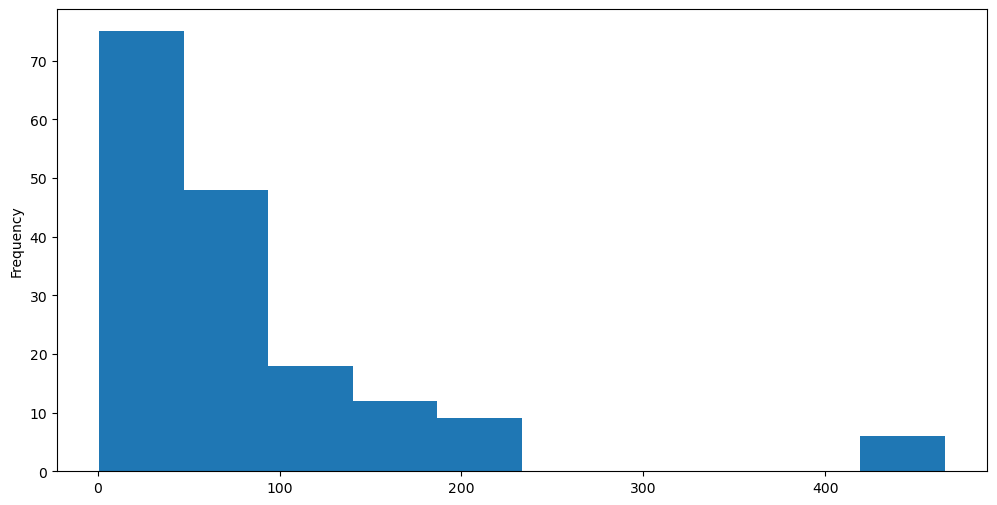

In [154]:
main["Foreign-born population with tertiary education per 1000"].plot(kind='hist', bins=10, figsize=(12,6))

In [155]:
main.select_dtypes(include='number').describe().T.sort_values("mean")

,count,mean,std,min,25%,50%,75%,max
Mean Vacancy rate,168.0,1.498102,0.668127,0.627262,1.020463,1.321637,1.916595,3.268580
Unemployment Rate,168.0,6.685714,2.806415,2.800000,5.025000,6.250000,7.625000,14.900000
Specialty cafes per million,168.0,12.558212,8.871806,1.958262,6.586159,10.113331,13.845139,34.597944
Foreign born asylum seekers per 1000 perpopulation,168.0,19.359694,31.540811,0.000000,1.216539,9.939853,22.718840,193.940731
Employment in Foreign Controlled Enterprises (%),168.0,19.385595,7.520217,6.880000,14.187500,18.785000,22.665000,44.230000
MIPEX score,168.0,53.428571,13.677453,37.000000,42.500000,49.500000,58.500000,86.000000
Corruption Index,168.0,63.928571,13.520254,42.000000,52.750000,61.000000,74.750000,90.000000
Foreign-born population with tertiary education per 1000,168.0,79.650481,91.051657,0.900964,23.066391,60.170769,101.334049,465.709829
Press Freedom Index,168.0,80.050714,7.850751,62.710000,76.230000,79.705000,85.592500,93.010000
Total housing costs in pps,168.0,565.125000,175.640361,241.000000,433.950000,588.700000,699.275000,868.900000


In [156]:
#What is the outlier?
main[main["Foreign-born population with tertiary education per 1000"]>400].Country

108    Luxembourg
109    Luxembourg
110    Luxembourg
111    Luxembourg
112    Luxembourg
113    Luxembourg
Name: Country, dtype: object

No Nan values have been recorded. Furthermore, based on the *desribe* statistic no implausible values have been noticed.Also the distribution of the dependent variable shows that in most countires the amount of foreign born tertiaries is below 100, but in almost all instances it is below or close to 200. The only outliers is Luxembourg, which is plausible as it is a fairly small country and in total a fairly urban area. That's why the value of foreign born tertiaries probably is that high and Luxembourg can be excluded as it might skew the results.


***
## 3. Explore and Modeling

First of all, the data is going to be visualized first by a correlation matrix and further with different plots showing the impact of the social variables. After that economic clustering is going to be performed, to group countries into similar groups. Finally, based on the groups foreign born tertiaries are going to be predicted via a KNN by the social variables. The main idea behind this procedure is that for similar economies skilled migrants prefer the ones scoring higher on the social variables after inspecting the economic ones. A knn was chosen, as it is a "lazy learner" and does not need a model. With our 27 observations many learning algorithms were excluded due to the lack of training data.



### 3.1. Exploring and visualizing

Before exploring relationships between different independent and dependent variables, we visualize our question in map form. Below is the map that we would like to explain.

In [157]:
main.explore(
    'Foreign-born population with tertiary education per 1000',
    legend=True,
    tooltip=['Country', 'Foreign-born population with tertiary education per 1000'],
    tiles='CartoDB positron',
    cmap='GnBu',
    style_kwds=dict(color='black'),
    vmax=200
)

Already, we can see that eastern European countries mostly have few foreign-born inhabitants with tertiary education. There are however variations among them.

Among western and northern countries, the variations are more apparent. Countries with seemingly comparable economies have a considerable gap between the number of educated foreigners, such as France and Germany, and Sweden and Finland.

In the rest of the section, we dive deeper in to the factors that explain the differences.

Before beginning any visualization, we first calculate the correlation matrix to get a rough view of which features might be correlated with our target variable.

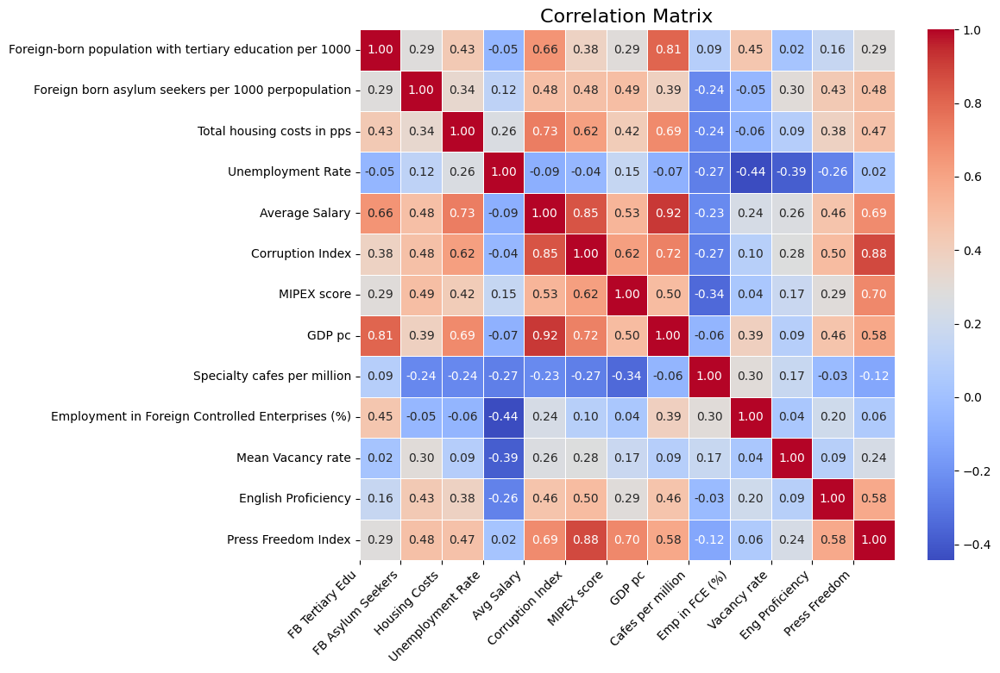

In [ ]:
# Copy the dataset
main_copy = main.copy()


# Correlation Matrix
corr_mtx = main_copy[["Foreign-born population with tertiary education per 1000",
        "Foreign born asylum seekers per 1000 perpopulation", "Total housing costs in pps",
        "Unemployment Rate", "Average Salary", "Corruption Index", "MIPEX score", "GDP pc",
        "Specialty cafes per million", "Employment in Foreign Controlled Enterprises (%)",
        "Mean Vacancy rate", "English Proficiency", "Press Freedom Index"
    ]
].corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap using Seaborn
sns.heatmap(corr_mtx, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

short_labels = ["FB Tertiary Edu", "FB Asylum Seekers", "Housing Costs",
                "Unemployment Rate", "Avg Salary", "Corruption Index",
                "MIPEX score", "GDP pc", "Cafes per million",
                "Emp in FCE (%)", "Vacancy rate", "Eng Proficiency", "Press Freedom"
               ]
plt.xticks(ticks=range(len(short_labels)), labels=short_labels, rotation=45, ha="right")


# Customize the plot
plt.title("Correlation Matrix", fontsize=16)

# Show the plot
plt.show()

We can see that it is mainly economical factors that are highly correlated with the amount of educated foreigners (first row/column). That gives a starting point.

We break down our features into 2 sets: economical and social factors, to help break down our analysis.

In [ ]:
vars_econ = [
    "GDP pc",
    "Average Salary",
    "Total housing costs in pps",
    "Unemployment Rate",
    "Employment in Foreign Controlled Enterprises (%)",
    "Mean Vacancy rate",
]
vars_soc = [
    "Corruption Index",
    "MIPEX score",
    "Specialty cafes per million",
    "English Proficiency",
    "Press Freedom Index"
]


#### 3.1.1 Exploring economic factors

One would reasonably assume that people want more money and would therefore move to places where they can have a higher pay check, as evident in the high correlation between GDP per capita and average salary, and the presence of educated foreigners. To what extent is that the case?

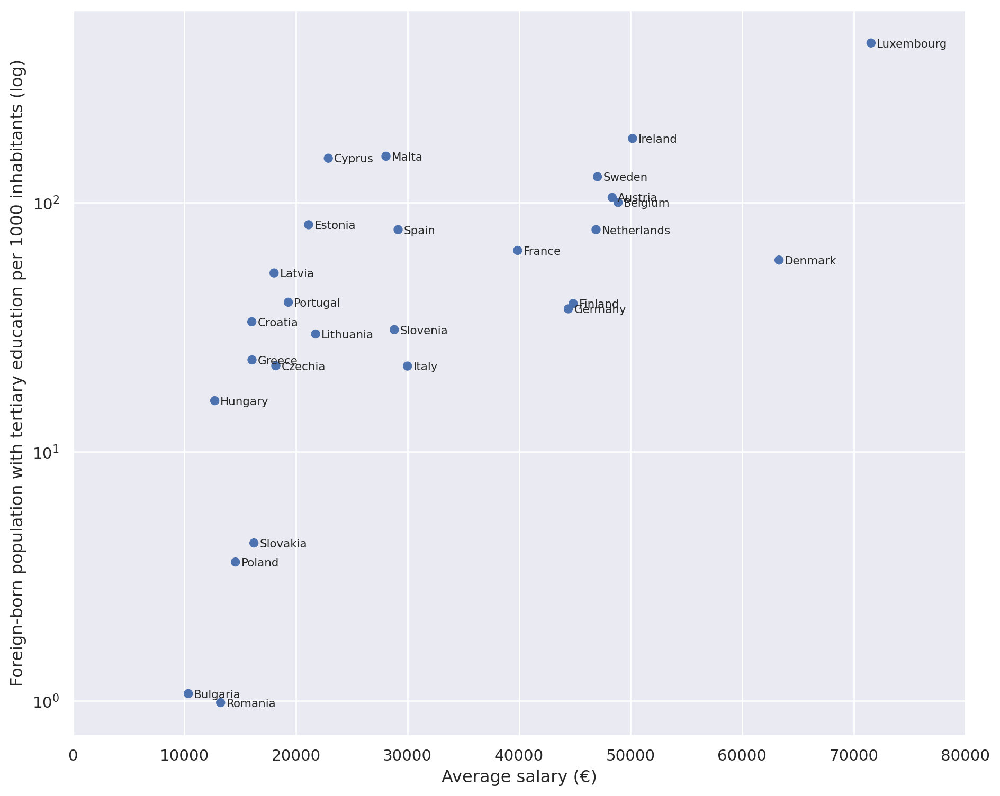

In [ ]:
(
    so.Plot(
        data=main,
        x='Average Salary',
        y="Foreign-born population with tertiary education per 1000"
        ,text="Country"
    )
    .add(so.Dot())
    .add(so.Text(fontsize=8, halign='left'))
    .layout(size=(10,8))
    .limit(x=(0, 80000))
    .label(x='Average salary (€)', y='Foreign-born population with tertiary education per 1000 inhabitants (log)')
    .scale(y='log')
)

We do see a positive correlation between Salary and educated foreign population. However, we see that the relationship of the 2 variables are different depending on the range of salary. Under ~€25000, the educated foreign population rose very quickly. After that, the effect seems to be milder.

This also show that salary alone is not a sufficient explanation. For instance, countires with average salary between €20000-€30000 have quite different educated foreign-born populations.

We look at further economic indicators of 2 pairs of countries with similar average salaries but big differecnes in educated foreign population.

First, we look at Estonia and Lithuania, both with average salary just over €20000 and have close geographic proximity to each other.

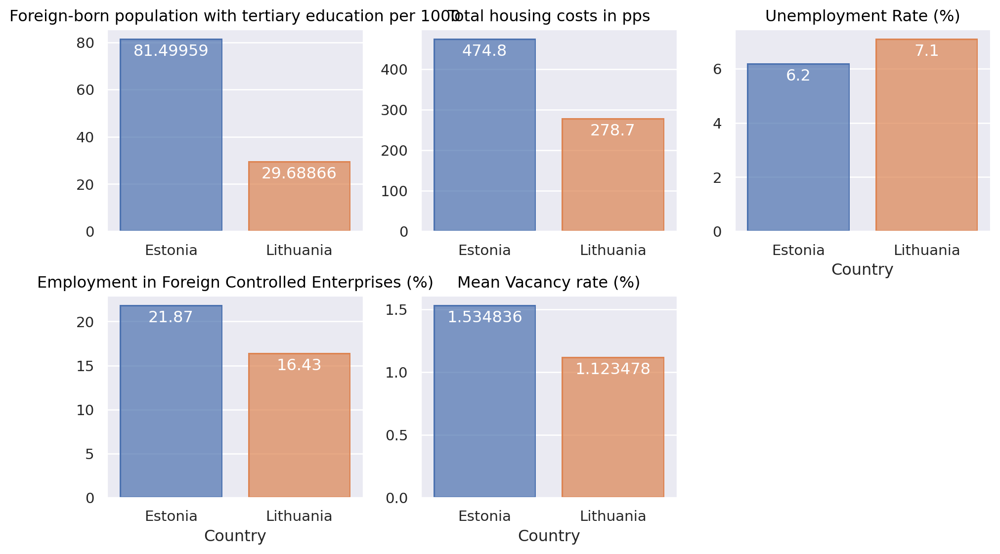

In [ ]:
constsal = (
    main[main['Country'].isin(['Estonia', 'Lithuania'])]
    [['Country', 'Foreign-born population with tertiary education per 1000', 'Total housing costs in pps', 'Unemployment Rate', 'Employment in Foreign Controlled Enterprises (%)', 'Mean Vacancy rate']]
    .rename({'Unemployment Rate': 'Unemployment Rate (%)', 'Mean Vacancy rate': 'Mean Vacancy rate (%)'}, axis=1)
    .T
)
constsal = (
    constsal.rename(columns=constsal.iloc[0])
    .drop(constsal.index[0])
    .reset_index()
    .rename({'index': 'Indicator'}, axis=1)
)
constsal = pd.melt(constsal, ['Indicator'], var_name='Country')
(
    so.Plot(constsal, x='Country', y='value', color='Country', text=constsal['value'].astype(str).str.slice(stop=8))
    .facet('Indicator', wrap=3)
    .add(so.Bar(), legend=False)
    .add(so.Text(color='w', valign='top'))
    .share(x=False, y=False)
    .layout(size=(10,6))
    .label(y=None)
)

Employment in foreign controlled enterprise is noticeably higher in Estonia. If we assume that local companies are less likely to employ foreigners, we could perhaps attribute the larger share of educated foreigners to higher foreign enterprise presence.

Housing costs are also substantially higher in Lithuania. This seems to reinforce the notion that professionals drive up housing costs, which put an area out of reach for others, and form a cycle of high housing costs and more immigration of educated people.

The next pair of countries we examine are the neighboring Sweden and Finland, which, as we are can see from the map above, have a big difference in the number of educated foreigners.

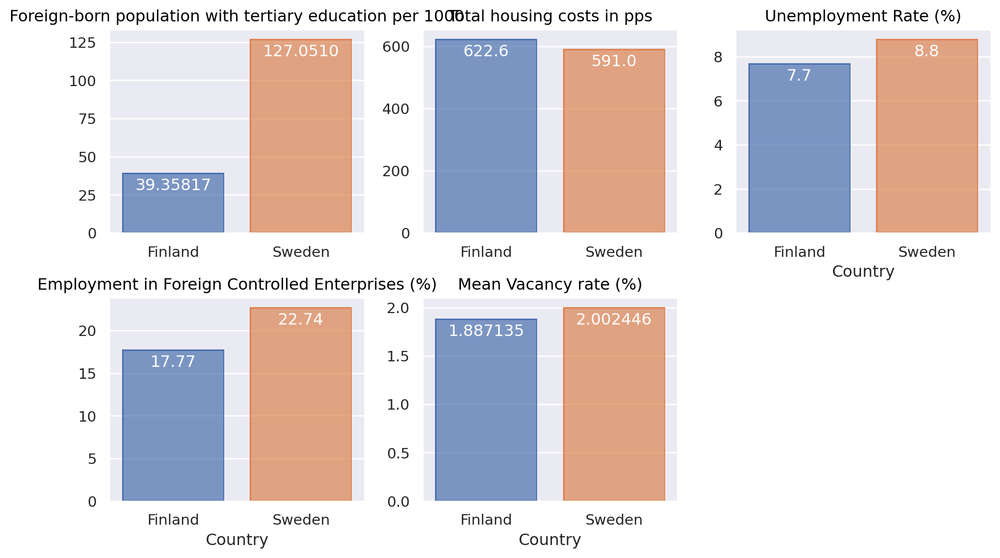

In [ ]:
constsal2 = (
    main[main['Country'].isin(['Finland', 'Sweden'])]
    [['Country', 'Foreign-born population with tertiary education per 1000', 'Total housing costs in pps', 'Unemployment Rate', 'Employment in Foreign Controlled Enterprises (%)', 'Mean Vacancy rate']]
    .rename({'Unemployment Rate': 'Unemployment Rate (%)', 'Mean Vacancy rate': 'Mean Vacancy rate (%)'}, axis=1)
    .T
)
constsal2 = (
    constsal2.rename(columns=constsal2.iloc[0])
    .drop(constsal2.index[0])
    .reset_index()
    .rename({'index': 'Indicator'}, axis=1)
)
constsal2 = pd.melt(constsal2, ['Indicator'], var_name='Country')
(
    so.Plot(constsal2, x='Country', y='value', color='Country', text=constsal2['value'].astype(str).str.slice(stop=8))
    .facet('Indicator', wrap=3)
    .add(so.Bar(), legend=False)
    .add(so.Text(color='w', valign='top'))
    .share(x=False, y=False)
    .layout(size=(10,6))
    .label(y=None)
)

We see from above that the indicators overall are more similar with each other than with Estonia and Lithuania. However, Sweden, which has more educated foreigners, again has more employment in foreign controlled enterprises.

We therefore examine the overall correlation between this indicator, salary, and our dependent variable to find overall patterns.

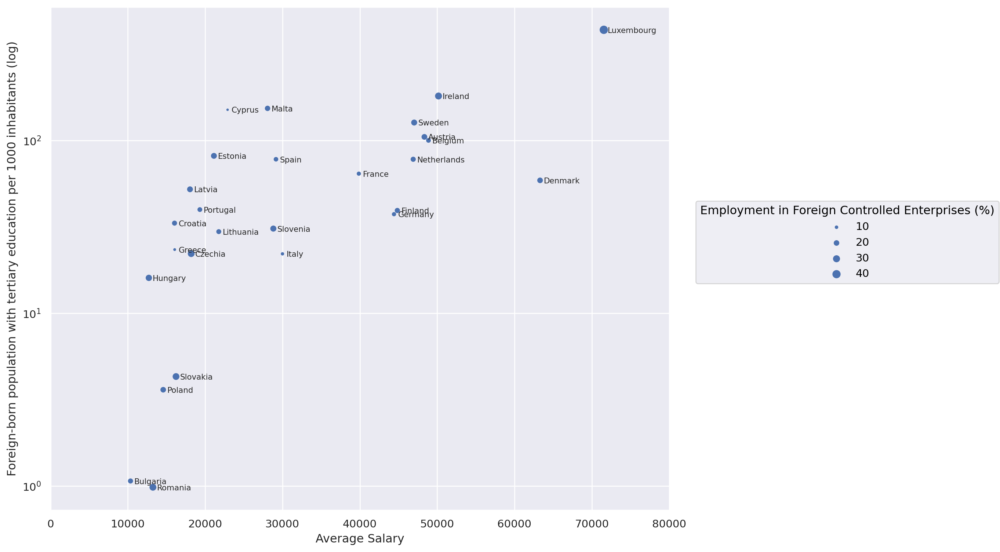

In [ ]:
(
    so.Plot(
        data=main,
        x="Average Salary",
        pointsize='Employment in Foreign Controlled Enterprises (%)',
        y='Foreign-born population with tertiary education per 1000',
        text="Country"
    )
    .add(so.Dot())
    .add(so.Text(fontsize=8, halign='left'))
    .layout(size=(10,8))
    .limit(x=(0, 80000))
    .scale(y='log')
    .label(y='Foreign-born population with tertiary education per 1000 inhabitants (log)')
)

However, from this plot, since the size of the dots do not generally increase along the y-axis within similar salary ranges, we see no clear pattern that at similar salaries, higher foreign enterprise employment necessarily means more educated foreigners. We however still do see that richer countries generally have higher proportion of said foreigners in their populations.

Since we fail to uncover patterns from examining pairs of countries close to each other, we visualize the relationships between our economic factors and the dependent variable for each of the individual features.

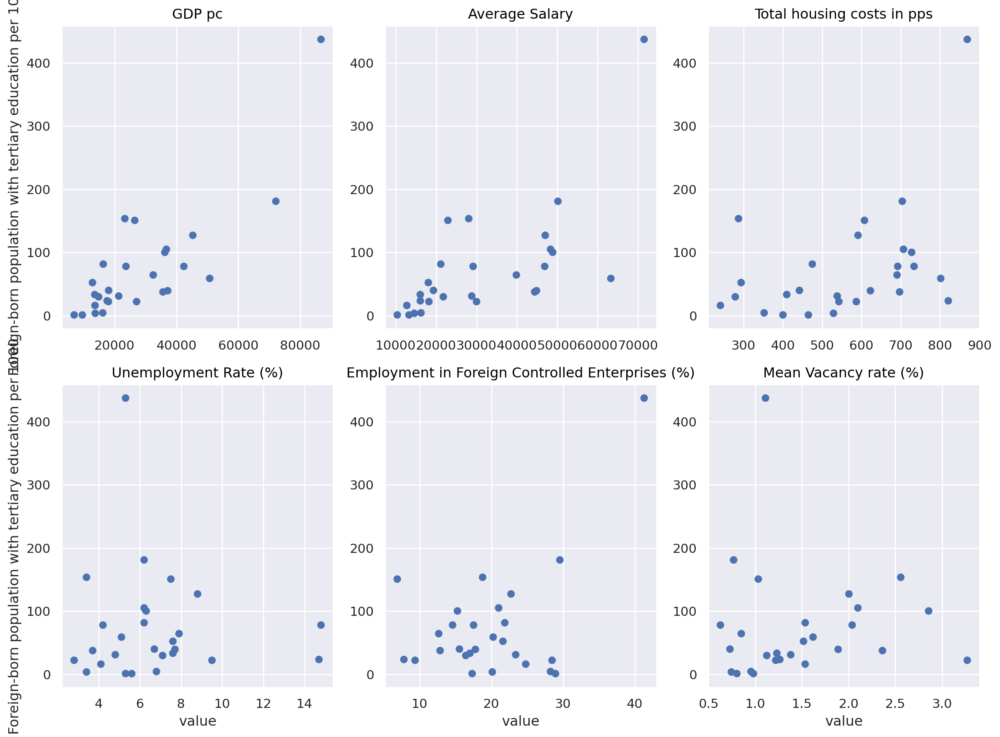

In [ ]:
plot_econ = main[
    [
        "Country",
        "Foreign-born population with tertiary education per 1000",
    ]
    + vars_econ
].rename(
    {
        "Unemployment Rate": "Unemployment Rate (%)",
        "Mean Vacancy rate": "Mean Vacancy rate (%)",
    },
    axis=1,
)
plot_econ = pd.melt(
    plot_econ,
    ["Country", "Foreign-born population with tertiary education per 1000"],
    value_vars=[
        "GDP pc",
        "Average Salary",
        "Total housing costs in pps",
        "Unemployment Rate (%)",
        "Employment in Foreign Controlled Enterprises (%)",
        "Mean Vacancy rate (%)",
    ],
    var_name="Indicator",
)
plot_econ.head(50)
(
    so.Plot(
        plot_econ,
        x="value",
        y="Foreign-born population with tertiary education per 1000",
        text="Country",
    )
    .facet("Indicator", wrap=3)
    .add(so.Dot(), legend=False)
    .share(x=False, y=False)
    .layout(size=(12, 9))
)

Apart from GDP per capita/salary, there are no obvious relationships between each feature with the target variable. Therefore, we attempt to explore the role of social factors to get a better picture.

#### 3.1.2 Visualization of social factors

As we have seen, economic indicators have a sizeable effect on
the number of foreign educated people, especially income. However, no single economic factor that we chose could differentiate countries.

The question arises to which degree the social factors play a role. The goal is to visualize the results.

Continuing with our Estonia-Lithuania example, we compare the chosen social metrics between the 2 countries.

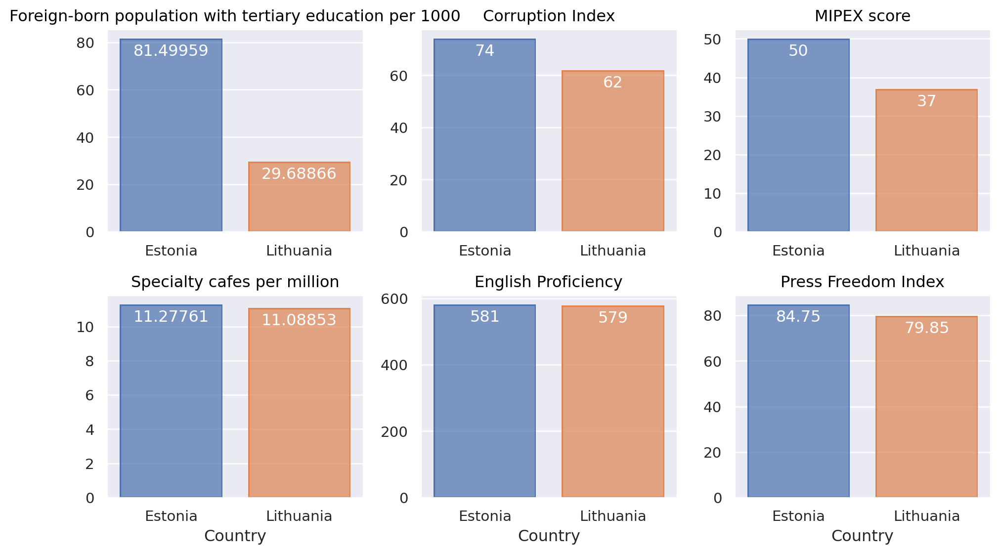

In [ ]:
bar_soc = (
    main[main['Country'].isin(['Lithuania', 'Estonia'])]
    [['Country', 'Foreign-born population with tertiary education per 1000'] + vars_soc]
    .T
)
bar_soc = (
    bar_soc.rename(columns=bar_soc.iloc[0])
    .drop(bar_soc.index[0])
    .reset_index()
    .rename({'index': 'Indicator'}, axis=1)
)
bar_soc = pd.melt(bar_soc, ['Indicator'], var_name='Country')
(
    so.Plot(bar_soc, x='Country', y='value', color='Country',text=bar_soc['value'].astype(str).str.slice(stop=8))
    .facet('Indicator', wrap=3)
    .add(so.Bar(), legend=False)
    .add(so.Text(color='w', valign='top'))
    .share(x=False, y=False)
    .layout(size=(10,6))
    .label(y=None)
)

From above, we see that Estonia has a higher MIPEX score, which could create more favorable conditions for educated foreigners to move there. Otherwise, the other metrics are quite similar.

We next revisit the Sweden-Finland comparison.

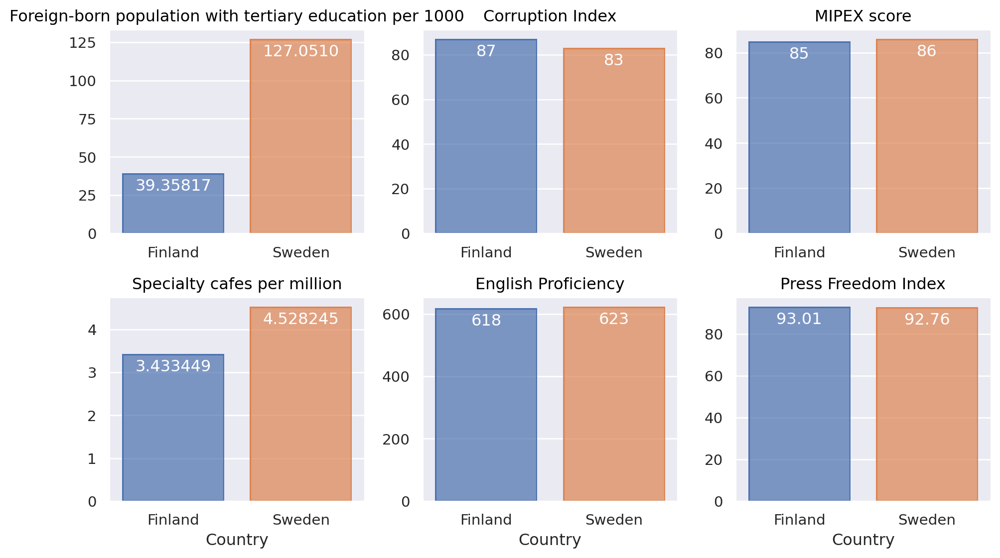

In [ ]:
bar_soc = (
    main[main['Country'].isin(['Finland', 'Sweden'])]
    [['Country', 'Foreign-born population with tertiary education per 1000'] + vars_soc]
    .T
)
bar_soc = (
    bar_soc.rename(columns=bar_soc.iloc[0])
    .drop(bar_soc.index[0])
    .reset_index()
    .rename({'index': 'Indicator'}, axis=1)
)
bar_soc = pd.melt(bar_soc, ['Indicator'], var_name='Country')
(
    so.Plot(bar_soc, x='Country', y='value', color='Country', text=bar_soc['value'].astype(str).str.slice(stop=8))
    .facet('Indicator', wrap=3)
    .add(so.Bar(), legend=False)
    .add(so.Text(color='w', valign='top'))
    .share(x=False, y=False)
    .layout(size=(10,6))
    .label(y=None)
)

This time, our feature fail to tell us what could account for the big gap between Finland and Sweden.

Like for economic factors, we visualize the relationships between our social factors and the dependent variable for each of the individual features.

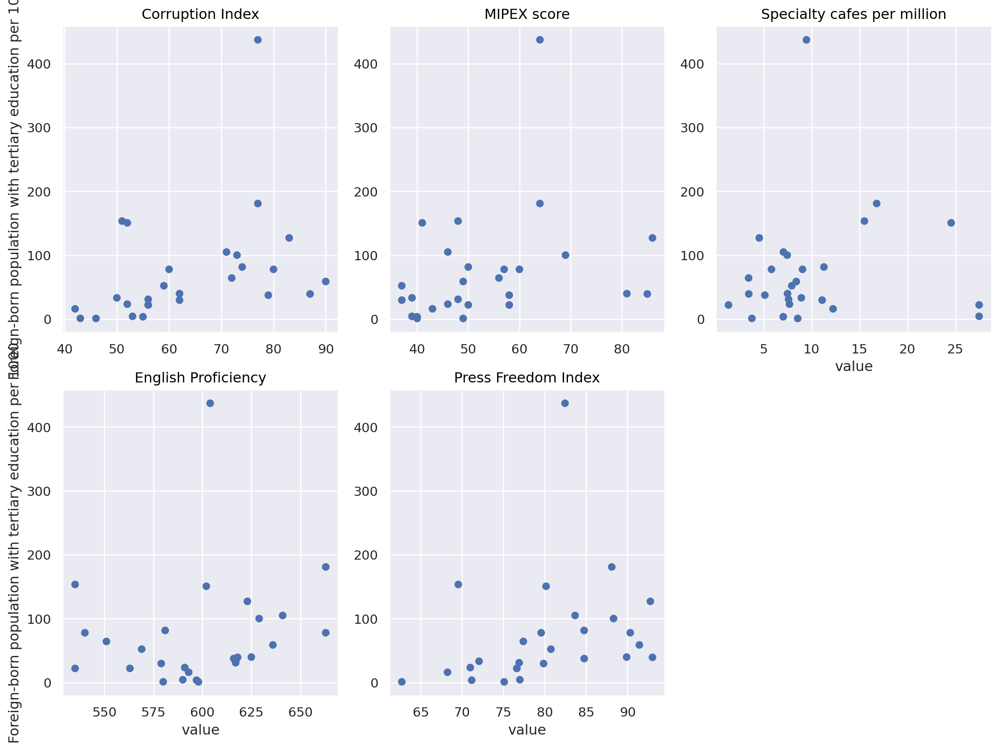

In [ ]:
plot_soc = main[
    ["Country", "Foreign-born population with tertiary education per 1000"]
    + vars_soc
]
plot_soc = pd.melt(
    plot_soc,
    ["Country", "Foreign-born population with tertiary education per 1000"],
    value_vars=vars_soc,
    var_name="Indicator",
)
plot_soc.head(50)
(
    so.Plot(
        plot_soc,
        x="value",
        y="Foreign-born population with tertiary education per 1000",
        text="Country",
    )
    .facet("Indicator", wrap=3)
    .add(so.Dot(), legend=False)
    .share(x=False, y=False)
    .layout(size=(12, 9))
)

From above, we see that no factors have a strong relationship with our target variable. Even though MIPEX looked to be a plausible explanation in the Estonia-Lithuania comparison, there is no obvious correlation between it and our variable of interest.

Since purely looking at neighboring countries have not given us much useful insights, we visualize overall views of social features.

A first idea is to inspect data based on parallel coordinates of the social to see their impact. Parallel coordinates are a possibility to visualize multiple numerical features in one plot. For this binning is used to separate the countries on economical terms, which is going to be used for the hue. The varaible chose is GDP per capita. Than these variables are plotted in the Parallel Coordinates.

In [ ]:
#Create a binning for all social variables

cols = ["Corruption Index", "MIPEX score", "Specialty cafes per million",
        "English Proficiency", "Press Freedom Index", "GDP pc"]

# num_bins
num_bins = 3

for col in cols:
    main[col] = pd.to_numeric(main[col], errors='coerce')
    main[col + '_bin'] = pd.cut(main[col], bins=num_bins, labels=False, right=True, retbins=False)


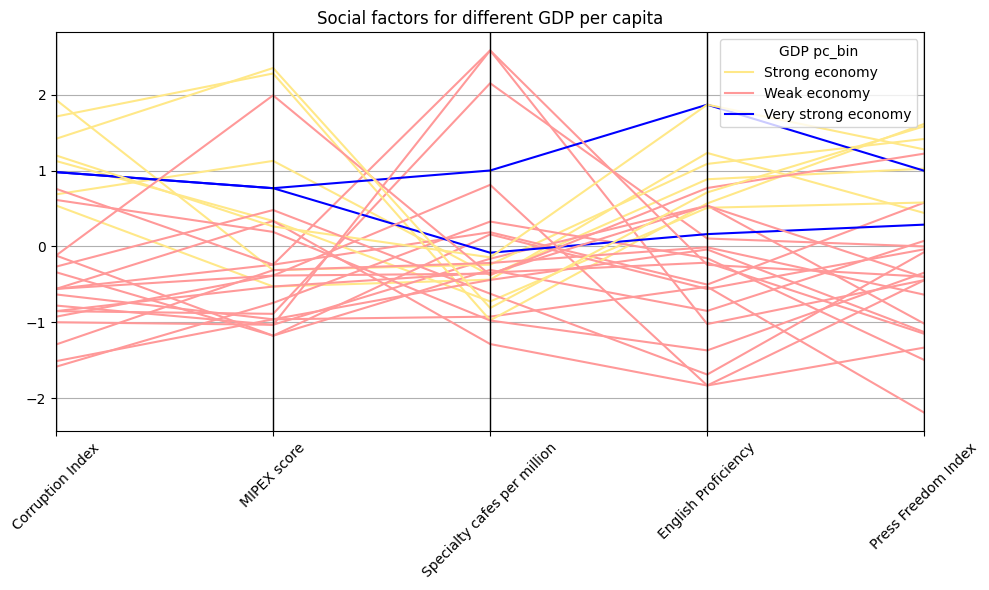

In [ ]:
# Scaling attribute values to avoid few outliers
cols = ["Corruption Index", "MIPEX score", "Specialty cafes per million",
        "English Proficiency", "Press Freedom Index"]
subset_df = main[cols]

ss = StandardScaler()

scaled_df = ss.fit_transform(subset_df)
scaled_df = pd.DataFrame(scaled_df, columns=cols)
final_df = pd.concat([scaled_df, main['GDP pc_bin']], axis=1)

# Map bin labels
bin_labels = {0: 'Weak economy', 1: 'Strong economy', 2: 'Very strong economy'}
final_df['GDP pc_bin'] = final_df['GDP pc_bin'].map(bin_labels)

# Plot parallel coordinates
fig, ax = plt.subplots(figsize=(10, 6))
pc = parallel_coordinates(final_df, 'GDP pc_bin', color=('#FFE888', '#FF9999', '#0000FF'), ax=ax)

plt.xticks(rotation=45)
legend = ax.legend(loc='upper right', title="GDP pc_bin")
legend.set_title("GDP pc_bin")
plt.title('Social factors for different GDP per capita')
plt.tight_layout()
plt.show()

As one can see, the social factors play an important role. A trend can be observed that most of the social variables have higher values for the countries with higher GDP per capita. Therefore social factors still remain important variables to be visualized.

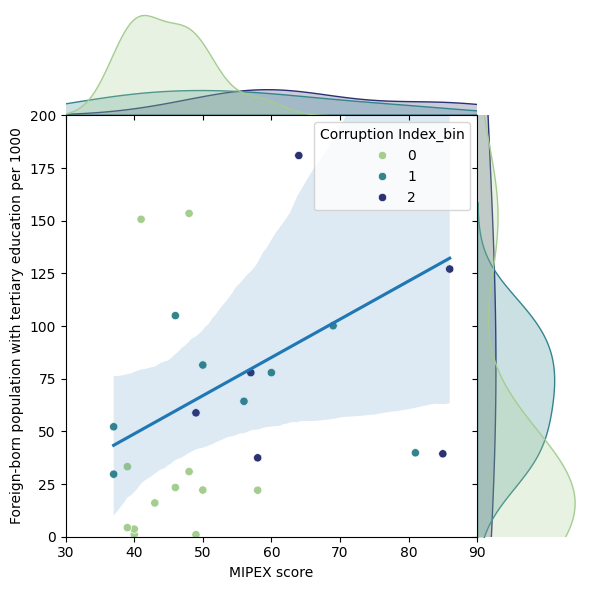

In [ ]:
#Inspect impact of MIPEX based on a JOINT plot

# Joint Plot with Regression Lineb
jp = sns.jointplot(x='MIPEX score', y='Foreign-born population with tertiary education per 1000', data=main, hue="Corruption Index_bin",
                    space=0,  ratio=4, palette=sns.color_palette("crest", as_cmap=True), xlim=(30,90),ylim=(0,200))
sns.regplot(x='MIPEX score', y='Foreign-born population with tertiary education per 1000', data=main, scatter=False, ax=jp.ax_joint)
plt.show()

The MIPEX score seem to have a sizeable effect on the Foreign born Tertiaries. Even though the correlation isn't particularly strong, an increasing MIPEX score is associate dwith more foreign born tertiaries. Also ine can see by the distribution plots, that for the Corruption Index being binned 1 compared to binned 0, the better Corruption index with the value 1 has in general more foreign born tertiaries.

### 3.3 Clustering & Insights

#### 3.3.1 Economic Clustering


In [ ]:
numerical_columns = main.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = [col for col in numerical_columns]

scaler = StandardScaler()
main_stand = main.drop('geometry', axis=1).copy()
main_stand[numerical_columns] = scaler.fit_transform(main[numerical_columns])


Cluster 1 Feature Importance:
GDP pc_bin                                                  1.305460
Average Salary                                              1.241977
Corruption Index_bin                                        1.176965
Corruption Index                                            1.176092
GDP pc                                                      1.124620
Press Freedom Index                                         1.026034
English Proficiency                                         0.989252
Press Freedom Index_bin                                     0.980581
English Proficiency_bin                                     0.908688
Total housing costs in pps                                  0.897197
Foreign born asylum seekers per 1000 perpopulation          0.827685
MIPEX score                                                 0.784628
MIPEX score_bin                                             0.700913
Foreign-born population with tertiary education per 1000    0.651263
Mea

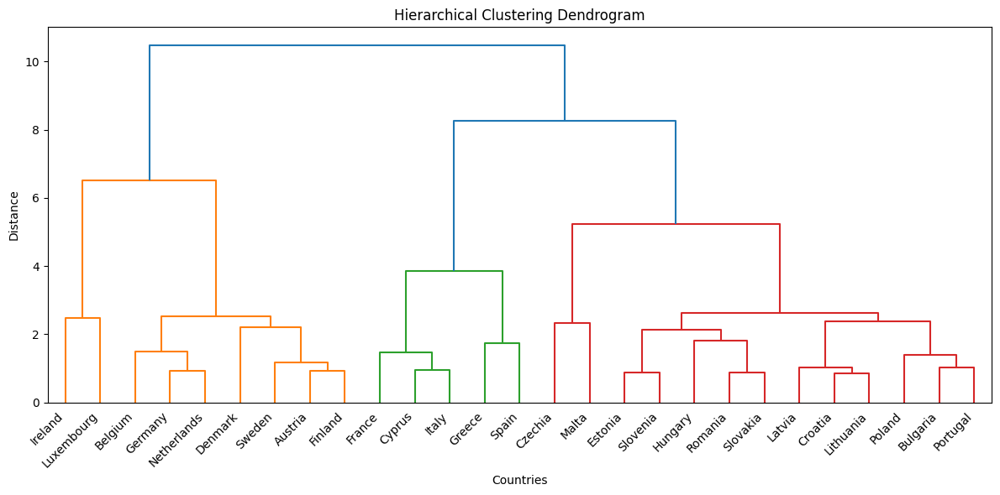

In [ ]:
# Try clustering with economic variables

economic_variables = [
    "Total housing costs in pps",
    "Unemployment Rate",
    "Average Salary",
    "GDP pc",
    "Employment in Foreign Controlled Enterprises (%)",
    "Mean Vacancy rate",
]

linkage_matrix = linkage(main_stand[economic_variables].values, method="ward")

num_clusters = 2
clusters = fcluster(linkage_matrix, t=num_clusters, criterion="maxclust")

main_stand["Cluster Econ"] = clusters
main["Cluster Econ"] = clusters

cluster_means = main_stand.groupby("Cluster Econ").mean(numeric_only=True)

for cluster_num in range(1, max(clusters) + 1):
    print(f"\nCluster {cluster_num} Feature Importance:")
    cluster_means = main_stand[main_stand["Cluster Econ"] == cluster_num].mean(numeric_only=True)
    print(cluster_means.drop("Cluster Econ").sort_values(ascending=False))

plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, labels=main["Country"].values, orientation="top")
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Countries")
plt.ylabel("Distance")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

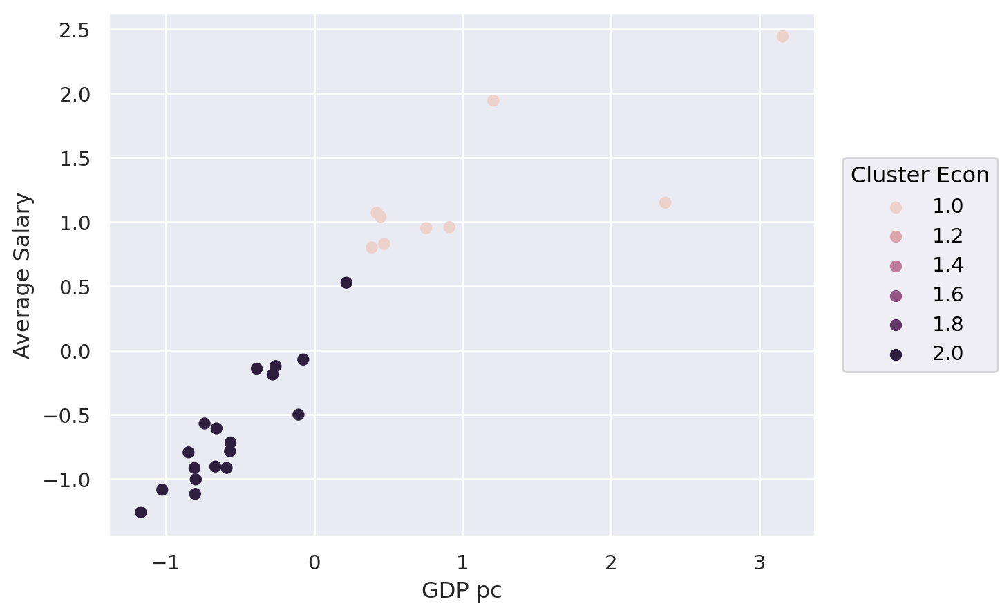

In [ ]:
(
    so.Plot(main_stand, x="GDP pc", y="Average Salary",  color='Cluster Econ')
    .add(so.Dot())
    .add(so.Text(fontsize=10, halign='left'))
)

Do the soical variables used in this project have an impact for strong economic countries?

In [ ]:
#Divide high economies into that two bins for foreign born tertiaries exclude luxemburg
main_econ_high=main[(main["Cluster Econ"] == 1) & (main["Country"]!="Luxembourg")]
main_econ_high["Foreign Bin Strong Econ"] = pd.cut(main_econ_high["Foreign-born population with tertiary education per 1000"], bins=2, labels=False, right=True, retbins=False)
counts_foreign_bin = main_econ_high["Foreign Bin Strong Econ"].value_counts()

# Display the counts
print(counts_foreign_bin)

0    6
1    2
Name: Foreign Bin Strong Econ, dtype: int64


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


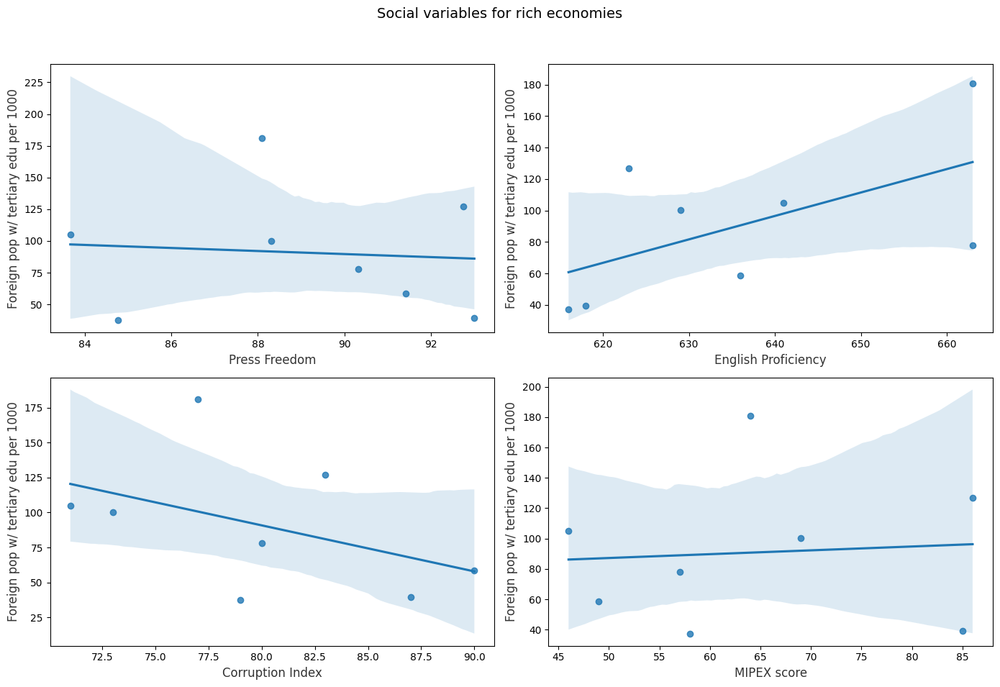

In [ ]:
# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Title for the entire subplot
fig.suptitle('Social variables for rich economies', fontsize=14)

# Plot 1
sns.regplot(x='Press Freedom Index', y='Foreign-born population with tertiary education per 1000', data=main_econ_high, scatter=True, ax=axes[0,0])
axes[0, 0].set_xlabel("Press Freedom", size=12, alpha=0.8)
axes[0, 0].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=12, alpha=0.8)

# Plot 2
sns.regplot(data=main_econ_high, x="English Proficiency", y="Foreign-born population with tertiary education per 1000", scatter=True,  ax=axes[0, 1])
axes[0, 1].set_xlabel("English Proficiency", size=12, alpha=0.8)
axes[0, 1].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=12, alpha=0.8)

# Plot 3
sns.regplot(data=main_econ_high, x="Corruption Index", y="Foreign-born population with tertiary education per 1000", scatter=True, ax=axes[1, 0])
axes[1, 0].set_xlabel("Corruption Index", size=12, alpha=0.8)
axes[1, 0].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=12, alpha=0.8)

# Plot 4
sns.regplot(data=main_econ_high, x="MIPEX score", y="Foreign-born population with tertiary education per 1000", scatter=True, ax=axes[1, 1])
axes[1, 1].set_xlabel("MIPEX score", size=12, alpha=0.8)
axes[1, 1].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=12, alpha=0.8)


plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
plt.show()

As the number of observations is fairly low, the conclusion are fairly limited. On the first glance, no obvious difference between the two country groups can be identified. The strongest varible is possible the English Proficiency.

Now the same procedure is performed for the Poorer economies.


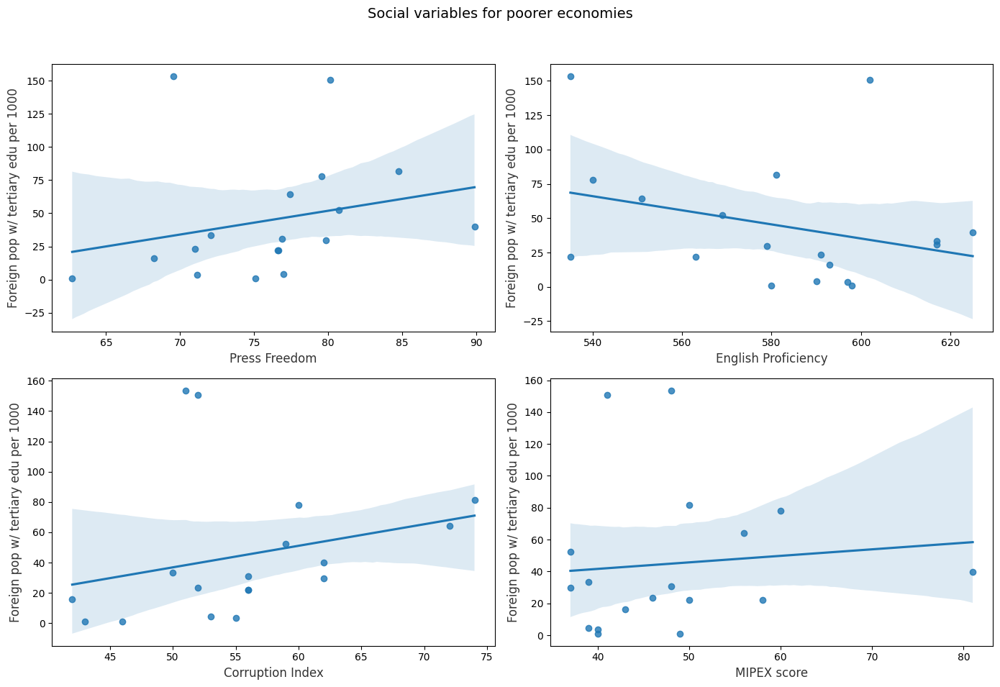

In [ ]:
#Divide high economies into that two bins for foreign born tertiaries and exclude Luxemburg
main_econ_low=main[main["Cluster Econ"] == 2]

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Title for the entire subplot
fig.suptitle('Social variables for poorer economies', fontsize=14)

# Plot 1
sns.regplot(x='Press Freedom Index', y='Foreign-born population with tertiary education per 1000', data=main_econ_low, scatter=True, ax=axes[0,0])
axes[0, 0].set_xlabel("Press Freedom", size=12, alpha=0.8)
axes[0, 0].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=12, alpha=0.8)

# Plot 2
sns.regplot(data=main_econ_low, x="English Proficiency", y="Foreign-born population with tertiary education per 1000", scatter=True,  ax=axes[0, 1])
axes[0, 1].set_xlabel("English Proficiency", size=12, alpha=0.8)
axes[0, 1].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=12, alpha=0.8)

# Plot 3
sns.regplot(data=main_econ_low, x="Corruption Index", y="Foreign-born population with tertiary education per 1000", scatter=True, ax=axes[1, 0])
axes[1, 0].set_xlabel("Corruption Index", size=12, alpha=0.8)
axes[1, 0].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=12, alpha=0.8)

# Plot 4
sns.regplot(data=main_econ_low, x="MIPEX score", y="Foreign-born population with tertiary education per 1000", scatter=True, ax=axes[1, 1])
axes[1, 1].set_xlabel("MIPEX score", size=12, alpha=0.8)
axes[1, 1].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=12, alpha=0.8)


plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
plt.show()

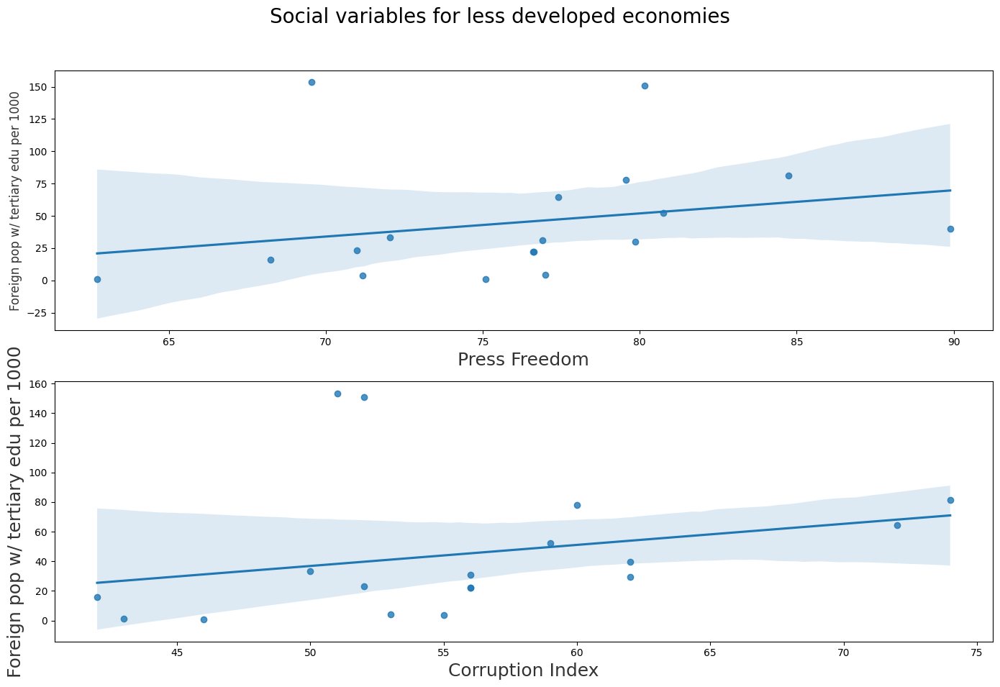

In [ ]:
# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Title for the entire subplot
fig.suptitle('Social variables for less developed economies', fontsize=20)

# Plot 1
sns.regplot(x='Press Freedom Index', y='Foreign-born population with tertiary education per 1000', data=main_econ_low, scatter=True, ax=axes[0])
axes[0].set_xlabel("Press Freedom", size=18, alpha=0.8)
axes[0].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=18, alpha=0.8)


# Plot 3
sns.regplot(data=main_econ_low, x="Corruption Index", y="Foreign-born population with tertiary education per 1000", scatter=True, ax=axes[1])
axes[1].set_xlabel("Corruption Index", size=18, alpha=0.8)
axes[1].set_ylabel("Foreign pop w/ tertiary edu per 1000", size=18, alpha=0.8)



plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
plt.show()

For the poorer economies there are more data points. Compared to the confidence intervals for the regressions plot for the richer economies the confidence intrevals seem to be smaller. Some noticable correlations are the Corruption Index and the Press Freedom Index. A possible explanation might be that migrants prefer countries that are free and have less corruption, as this entails more freedom of expression and more chances to participate in economic life.

#### 3.3.3 Prediction with kNN

We would like to see whether social variables have different effects on the amount of foreign-born educated population within countries with comparable economies. As a proxy, we use a regressor to predict the target variable by comparing the social metrics of a country to other countries with similar economies.

For prediction based on proximity of samples, kNN is a natural choice. With countries grouped by economic indicators, we use a kNN regressor and leave-one-out cross-validation to predict foreign educated population of each country within each group based on social factors.

We run the prediction with $k$ from 1 to 8, to get a better sense of prediction for performance under different experiment settings.

As controls, we also run the experiment on all countries (no grouping), and predicting on different feature sets.

In [ ]:
cv = {
    'Experiment': [],
    'k': [],
    'squared residuals': []
}

data_subsets = {
    'All countries': [True] * main.shape[0],
    'Rich countries': main["Cluster Econ"] == 1,
    'Poor countries': main["Cluster Econ"] == 2
}
feature_subsets = {
    'All features': [*vars_soc, *vars_econ, "Foreign-born population with tertiary education per 1000"],
    'Econ features': [*vars_econ, "Foreign-born population with tertiary education per 1000"],
    'Social features': [*vars_soc, "Foreign-born population with tertiary education per 1000"]
}

# vars_model = [*vars_soc, *vars_econ, "Foreign-born population with tertiary education per 1000"]
# 1: Rich, 2: Poor
for group, sel in data_subsets.items():
    for fg, fs in feature_subsets.items():
        if 'All' not in group and 'Econ' in fg:
            continue
        exp = f'{group}, {fg}'
        subset = main[sel][fs]
        # print(subset.head(5))
        scaler = StandardScaler()
        subset[fs] = scaler.fit_transform(subset[fs])

        # Extract features and target variable
        X = subset.values
        y = subset["Foreign-born population with tertiary education per 1000"].values
        # Perform leave-one-out cross-validation
        loo = LeaveOneOut()

        # Initialize an array to store residuals

        for k in range(1, 9):
            res = np.zeros_like(y, dtype=float)
            for train_index, test_index in loo.split(X):
                X_train, X_test = X[train_index], X[test_index]
                y_train, y_test = y[train_index], y[test_index]

                knn = KNeighborsRegressor(n_neighbors=k)

                # Fit the model on the training data
                knn.fit(X_train, y_train)

                # Make a prediction for the test instance
                prediction = knn.predict(X_test)
                # print(y_test)
                # Compute and store the residual
                res[test_index] = (prediction - y_test) ** 2

            cv['Experiment'].append(exp)
            cv['k'].append(k)
            cv['squared residuals'].append(res)
cv_df = pd.DataFrame.from_dict(cv)
cv_df['MSE'] = cv_df['squared residuals'].map(np.mean)

The CV scores under different settings and $k$ value are visualised below.

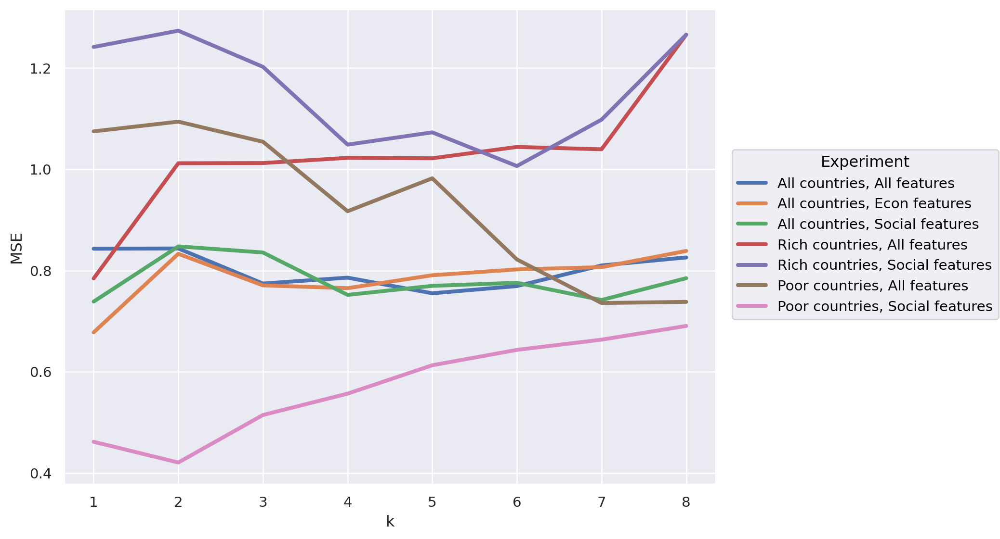

In [ ]:
(
    so.Plot(cv_df, x='k', y='MSE', color='Experiment')
    .add(so.Line(linewidth=3))
    .layout(size=(8,6))
)

We can see that in general, prediction within poor countries with social features gave us the best results, while prediction within rich countries with social features gave the worst. This result seems to tell us that social features are are better predictors of educated foreigner populations in poor countries than in rich countries.

For a more quantifiable results, we also perform significance test on the cross-validation results of the experiments **'Rich countries, Social features** and **Poor countries, Social features** with the following setup.

We use a one-tailed two Sample t-Test.

$H_{0}: MSE_{Rich countries, Social features} = MSE_{Poor countries, Social features}$

$H_{1}: MSE_{Rich countries, Social features} > MSE_{Poor countries, Social features}$

In words, our null hypothesis is that the amount of educated foreigners can be predicted equally well in rich and poor countries respectively. The alternative is that the amount of educated foreigners can be better predicted in poor countries than in rich countries.

We decide to not set a significance level and report the p-values. It is up to the readers to decide what to make of the probabilities.

In [ ]:
ttests = []
cv_test = cv_df[cv_df['Experiment'].isin(['Rich countries, Social features', 'Poor countries, Social features'])]
for k in range(1, 9):
    rich = cv_test[(cv_test['k'] == k) & cv_test['Experiment'].str.contains('Rich')]['squared residuals'].iloc[0]
    poor = cv_test[(cv_test['k'] == k) & cv_test['Experiment'].str.contains('Poor')]['squared residuals'].iloc[0]
    ttests.append((k, ttest_ind(rich, poor, alternative="greater").pvalue))
ttests = pd.DataFrame.from_records(ttests, columns=['k', 'p-value'])
ttests

,k,p-value
0,1,0.126248
1,2,0.142213
2,3,0.192823
3,4,0.250901
4,5,0.272417
5,6,0.327668
6,7,0.302070
7,8,0.250387


In our experiment, the $p$-value can be interpreted as follows:

The probability, when assuming the null hypothesis, of seeing residuals equal to or more than the reported ones.

If common significance levels (0.1, 0.05, etc.) are used, the null hypothesis is not rejected. However, the $p$-values still tell us it is unlikely for us to observe this difference in performance assuming the response variable can be predicted equally well.

As such, the results are inline with our observation that social factors are more important within poor countries for the amount of foreign-born educated people there.

## 4. Conclusion

A few final conclusions can be enumerated after completing the project.

First of all, it has to be pointed out that skilled migrants, considering the demographic situation of a lot of European countries, typically have various options of migration. As found, like for example, by the correlation matrix there is a fairly strong link between the GDP per capita and the amount of foreign-born tertiaries. Foreign-born tertiaries tend to go to more economically developed countries. However, also the question arises, whether the social factor or soft factors also play a role in the decision of foreign-born tertiaries to migrate.

It was found that for the richer countries none of the proposed social variables had some correlation with the number of migrants. However, for the poorer countries better scores in the social variables like for example Corruption Index or Freedom of Press Index indeed increased the amount of foreign-born tertiaries. A possible explanation might that there are substantial language barriers between European countries as there are for example slavic, romanic and germanic language families. Therefore, a tertiary educated migrant might leave his country to move to a country with higher social variables but which is still fairly similar culturally.

Moreover, with kNN regressor, an estimator based on proximity, we found some support that social factors are better predictors for the amount of educated foreigners in the population within poor countries than in rich countries. This could serve a takeaway for poor countries - one of the ways to encourage educated foreigners might be to improve some of the social conditions we analyzed. For the poorer economies it might be fairly important to improve Press Freedom and Corruption as this seems to be linked to the foreign born tertiaries.

Finally, it has to be said that the analysis of such specific data is complicated and has many cultural, social and historic reasons. For that, domain experts would really help the analysis to understand the nuances of migration and latent factors, which are hard to express through data. Furthermore, the nationality distribution of those foreign-born countries tertiaries might be really helpful to gain more insights, however this data is not available on Eurostat, the main and most credible source for European data. Overall, policy makers should strive to improve the countries economies as with that the social variables also tend to increase.

## 5. Division of work

| Step                                              | Vladimir | Ivan | Ahmed | Yat Hin |
|---------------------------------------------------|----------|------|-------|---------|
| Obtaining data                                    |    X     |   X  |   X   |    X    |
| Pre-processing                                    |    X     |   X  |   X   |    X    |
| Exploration and visualisation of economic factors |    X     |      |       |    X    |
| Exploration and visualisation of social factors   |    X     |      |       |    X    |
| Clustering                                        |          |      |   X   |         |
| Insights                                          |    X     |   X  |   X    |    X    |
| Prediction with kNN                               |    X     |   X   |       |    X    |
| Creating the presentation                               |         |      |   X    |       |
| Creating the report                               |    X     |   X   |     |    X   |

## 6. References

[1] Banerjee, Abhijit V. and Esther Duflo. "From the Mouth of the Shark." In *Good Economics for Hard Times*. First edition. New York, PublicAffairs, 2019.
